# Importing Libraraies 

In [1]:
import pandas as pd
import numpy as np

# Loading the Data 

In [2]:
df = pd.read_csv('Wholesale customers data.csv')

In [3]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,2,3,12669,9656,7561,214,2674,1338
1,2,3,7057,9810,9568,1762,3293,1776
2,2,3,6353,8808,7684,2405,3516,7844
3,1,3,13265,1196,4221,6404,507,1788
4,2,3,22615,5410,7198,3915,1777,5185


In [4]:
# Renaming column and maping values 
df = df.rename(columns={'Delicassen': 'Delicatessen'})
df['Channel'] = df['Channel'].map({1: 'HoReca', 2: 'Retail'})
df['Region'] = df['Region'].map({1: 'Lisbon', 2: 'Porto', 3: 'Other'})

In [5]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
0,Retail,Other,12669,9656,7561,214,2674,1338
1,Retail,Other,7057,9810,9568,1762,3293,1776
2,Retail,Other,6353,8808,7684,2405,3516,7844
3,HoReca,Other,13265,1196,4221,6404,507,1788
4,Retail,Other,22615,5410,7198,3915,1777,5185


In [6]:
df.columns.tolist()

['Channel',
 'Region',
 'Fresh',
 'Milk',
 'Grocery',
 'Frozen',
 'Detergents_Paper',
 'Delicatessen']

In [7]:
features = [
#     'Channel',
#     'Region',
     'Fresh',
     'Milk',
     'Grocery',
     'Frozen',
     'Detergents_Paper',
     'Delicatessen'
]

df[features].describe()

,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,12000.297727,5796.265909,7951.277273,3071.931818,2881.493182,1524.870455
std,12647.328865,7380.377175,9503.162829,4854.673333,4767.854448,2820.105937
min,3.000000,55.000000,3.000000,25.000000,3.000000,3.000000
25%,3127.750000,1533.000000,2153.000000,742.250000,256.750000,408.250000
50%,8504.000000,3627.000000,4755.500000,1526.000000,816.500000,965.500000
75%,16933.750000,7190.250000,10655.750000,3554.250000,3922.000000,1820.250000
max,112151.000000,73498.000000,92780.000000,60869.000000,40827.000000,47943.000000


# Exploratory Data Analysis

In [8]:
import matplotlib 
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt 
plt.style.use('ggplot')
import seaborn as sns


In [9]:
df.Region.value_counts()

Other     316
Lisbon     77
Porto      47
Name: Region, dtype: int64

In [10]:
df.Channel.value_counts()

HoReca    298
Retail    142
Name: Channel, dtype: int64

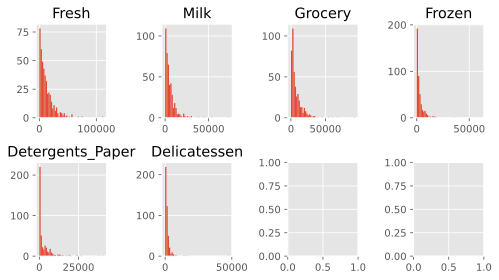

In [11]:
fig, axes = plt.subplots(2 , 4, figsize=(7,4))

for feature, ax in zip(features, axes.ravel()):
    if (feature=='Channel') | (feature=='Region'):
        df[feature].value_counts().plot.bar(ax=ax)
    else:
        ax.hist(df[feature], bins=50)
    ax.set_title(feature)
plt.tight_layout()

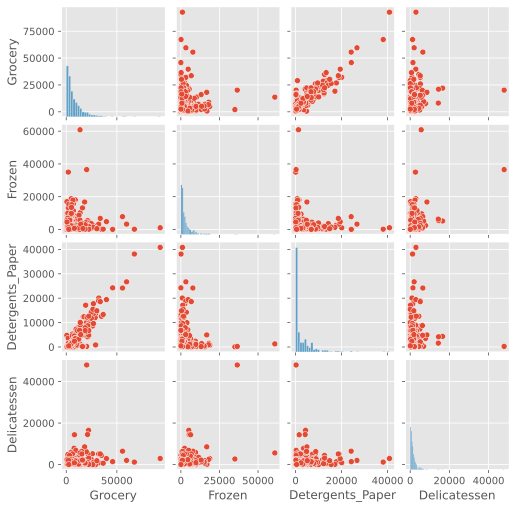

In [12]:
pplot = sns.pairplot(df, vars=features[2:])
pplot.fig.set_size_inches(7, 7)

# Principal Component Analysis

In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [14]:
data = df[features].to_numpy()
data.shape

(440, 6)

In [15]:
scaler = StandardScaler()
data = scaler.fit_transform(data)
data[:, 0].std()

1.0

In [16]:
data

array([[ 0.05293319,  0.52356777, -0.04111489, -0.58936716, -0.04356873,
        -0.06633906],
       [-0.39130197,  0.54445767,  0.17031835, -0.27013618,  0.08640684,
         0.08915105],
       [-0.44702926,  0.40853771, -0.0281571 , -0.13753572,  0.13323164,
         2.24329255],
       ...,
       [ 0.20032554,  1.31467078,  2.34838631, -0.54337975,  2.51121768,
         0.12145607],
       [-0.13538389, -0.51753572, -0.60251388, -0.41944059, -0.56977032,
         0.21304614],
       [-0.72930698, -0.5559243 , -0.57322717, -0.62009417, -0.50488752,
        -0.52286938]])

In [17]:
# Reducing the dimension of the data
pca = PCA(n_components=2)
res_pca = pca.fit_transform(data)

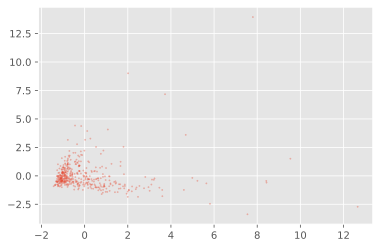

In [18]:
plt.scatter(res_pca[:, 0], res_pca[:, 1], s=2, alpha=0.3)

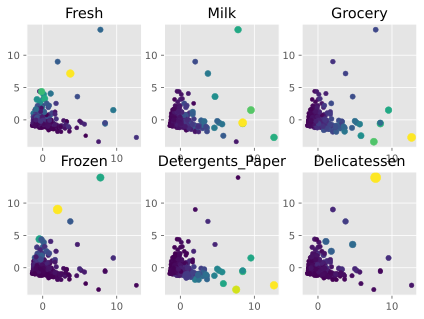

In [19]:
fig, axes = plt.subplots(2, 3, figsize=(7,5))

for feature,ax in zip(features, axes.ravel()):
    cmap = 'viridis'
    sizes = 20+5*data[:, features.index(feature)]
    cols = df[feature]
    ax.scatter(res_pca[:, 0], res_pca[:, 1], s=sizes, c=cols, cmap=cmap)
    ax.set_title(feature)

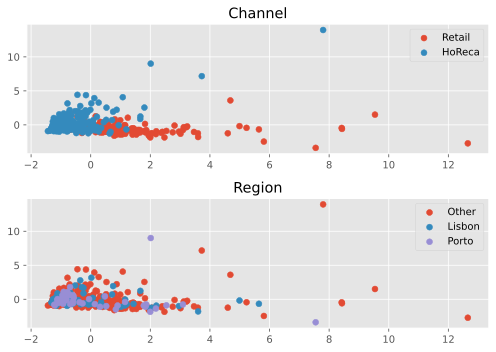

In [20]:
fig, axes = plt.subplots(2 ,1, figsize=(7, 5))

for feature, ax in zip(['Channel', 'Region'], axes.ravel()):
    cmap = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(
            res_pca[df[feature]==unique_val, 0],
            res_pca[df[feature]==unique_val, 1],
            label=unique_val
        )
        ax.set_title(feature)
        ax.legend()
plt.tight_layout()

# Kernel Principal Component Analysis

In [21]:
from sklearn.decomposition import KernelPCA

# Polynomial Function

In [22]:
kpca = KernelPCA(n_components=2, kernel='poly', degree=2)
res_kpca_poly = kpca.fit_transform(data)

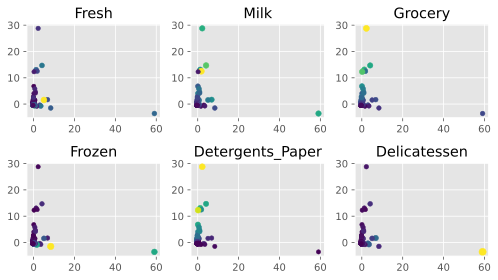

In [23]:
fig, axes = plt.subplots(2, 3, figsize=(7, 4))

for feature,ax in zip(features, axes.ravel()):
    cmap = 'viridis'
    sizes = 20+2*data[:, features.index(feature)]
    cols = df[feature]
    ax.scatter(res_kpca_poly[:, 0], res_kpca_poly[:, 1], s=sizes, c=df[feature], cmap=cmap)
    ax.set_title(feature)
plt.tight_layout()

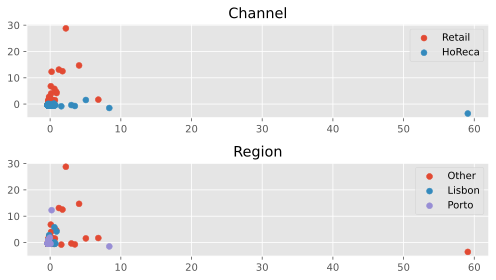

In [24]:
fig, axes = plt.subplots(2 ,1, figsize=(7, 4))

for feature, ax in zip(['Channel', 'Region'], axes.ravel()):
    cmap = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(
            res_kpca_poly[df[feature]==unique_val, 0],
            res_kpca_poly[df[feature]==unique_val, 1],
            label=unique_val
        )
        ax.set_title(feature)
        ax.legend()
plt.tight_layout()

# Radial Basis Function

In [25]:
kpca = KernelPCA(n_components=2, kernel='rbf')
res_kpca_rbf = kpca.fit_transform(data)

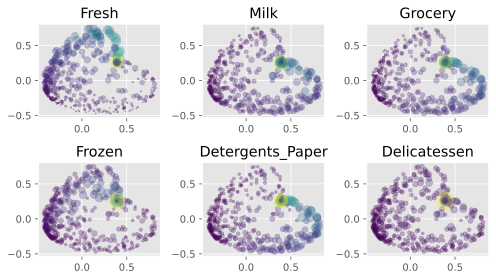

In [26]:
fig, axes = plt.subplots(2, 3, figsize=(7, 4))

for feature,ax in zip(features, axes.ravel()):
    cmap = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    cols = df[feature]
    ax.scatter(res_kpca_rbf[:, 0], res_kpca_rbf[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cmap)
    ax.set_title(feature)
plt.tight_layout()

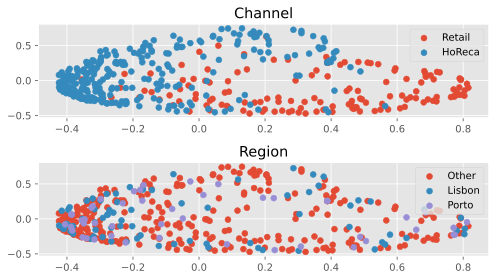

In [27]:
fig, axes = plt.subplots(2 ,1, figsize=(7, 4))

for feature, ax in zip(['Channel', 'Region'], axes.ravel()):
    cmap = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(
            res_kpca_rbf[df[feature]==unique_val, 0],
            res_kpca_rbf[df[feature]==unique_val, 1],
            label=unique_val
        )
        ax.set_title(feature)
        ax.legend()
plt.tight_layout()

# Cosine Function

In [28]:
kpca = KernelPCA(n_components=2, kernel='cosine')
res_kpca_cos = kpca.fit_transform(data)

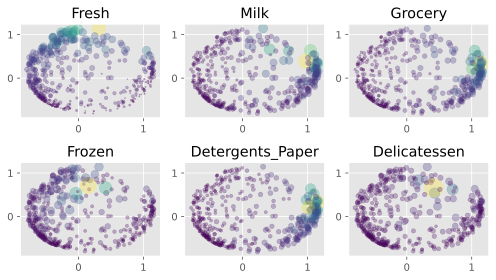

In [29]:
fig, axes = plt.subplots(2, 3, figsize=(7, 4))

for feature,ax in zip(features, axes.ravel()):
    cmap = 'viridis'
    sizes = 20+20*data[:, features.index(feature)]
    cols = df[feature]
    ax.scatter(res_kpca_cos[:, 0], res_kpca_cos[:, 1], s=sizes, alpha=0.3, c=df[feature], cmap=cmap)
    ax.set_title(feature)
plt.tight_layout()

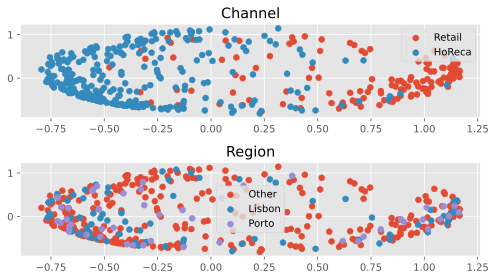

In [30]:
fig, axes = plt.subplots(2 ,1, figsize=(7, 4))

for feature, ax in zip(['Channel', 'Region'], axes.ravel()):
    cmap = 'Pastel1'
    sizes = 20
    for unique_val in df[feature].unique():
        ax.scatter(
            res_kpca_cos[df[feature]==unique_val, 0],
            res_kpca_cos[df[feature]==unique_val, 1],
            label=unique_val
        )
        ax.set_title(feature)
        ax.legend()
plt.tight_layout()

# Append to Dataframe 

In [31]:
df['x_kpca_poly'] = res_kpca_poly[:, 0]
df['y_kpca_poly'] = res_kpca_poly[:, 1]

df['x_kpca_rbf'] = res_kpca_rbf[:, 0]
df['y_kpca_rbf'] = res_kpca_rbf[:, 1]

df['x_kpca_cos'] = res_kpca_cos[:, 0]
df['y_kpca_cos'] = res_kpca_cos[:, 1]

In [32]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-0.298146,-0.307672,0.078374,-0.173115,0.504789,0.009622
1,Retail,Other,7057,9810,9568,1762,3293,1776,-0.272613,-0.248762,0.185813,-0.307415,0.889941,-0.262833
2,Retail,Other,6353,8808,7684,2405,3516,7844,0.557870,-0.356102,0.341702,0.075048,0.473994,0.235687
3,HoReca,Other,13265,1196,4221,6404,507,1788,-0.263419,-0.454023,-0.253304,0.250352,-0.618611,0.370131
4,Retail,Other,22615,5410,7198,3915,1777,5185,0.126922,-0.432733,0.136617,0.375279,0.068900,0.861829


# K-Means Clustering 

In [33]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

In [34]:
res_kpca = df[['x_kpca_cos', 'y_kpca_cos']].to_numpy()

In [35]:
clusterer = KMeans(n_clusters=5)
clusters = clusterer.fit_predict(res_kpca)

In [36]:
clusters[:5]

array([3, 1, 1, 0, 2], dtype=int32)

In [37]:
markers = list('*hH+xXDd|.,ov^<>12348spP')

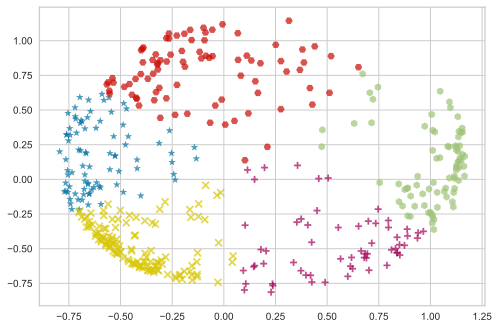

In [38]:
for cluster in np.unique(clusters):
    cluster_data = res_kpca[clusters==cluster]
    plt.scatter(cluster_data[:, 0],
                cluster_data[:, 1],
                alpha=0.7,
                marker=markers[cluster]
    )

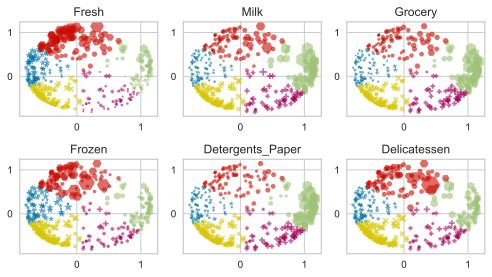

In [39]:
fig, axes = plt.subplots(2, 3, figsize=(7, 4))

for feature, ax in zip(features, axes.ravel()):
    cmap = 'viridis'
    for cluster in np.unique(clusters):
        cluster_data = res_kpca[clusters==cluster]
        sizes = 20+20*data[:, features.index(feature)][clusters==cluster]
        ax.scatter(
            cluster_data[:, 0],
            cluster_data[:, 1],
            s=sizes,
            alpha=0.6,
            cmap=cmap,
            marker=markers[cluster]
        )
    ax.set_title(feature)
plt.tight_layout()

In [40]:
df['cluster_kpca_cos'] = clusters

# Elbow Method 

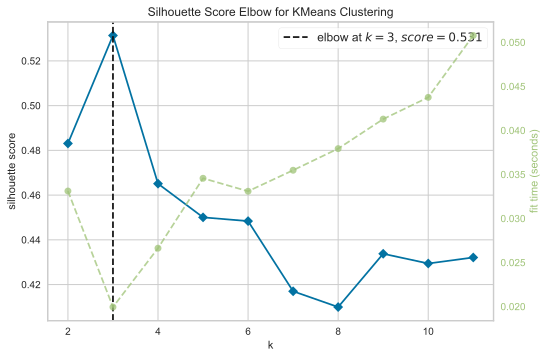

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [41]:
clusterer = KMeans()
visualizer = KElbowVisualizer(clusterer, k=(2, 12), metric='silhouette')

visualizer.fit(res_kpca)
visualizer.show()

# Interactive Cluster Analysis 

In [42]:
import plotly.graph_objects as go

In [43]:
df.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos,cluster_kpca_cos
0,Retail,Other,12669,9656,7561,214,2674,1338,-0.298146,-0.307672,0.078374,-0.173115,0.504789,0.009622,3
1,Retail,Other,7057,9810,9568,1762,3293,1776,-0.272613,-0.248762,0.185813,-0.307415,0.889941,-0.262833,1
2,Retail,Other,6353,8808,7684,2405,3516,7844,0.557870,-0.356102,0.341702,0.075048,0.473994,0.235687,1
3,HoReca,Other,13265,1196,4221,6404,507,1788,-0.263419,-0.454023,-0.253304,0.250352,-0.618611,0.370131,0
4,Retail,Other,22615,5410,7198,3915,1777,5185,0.126922,-0.432733,0.136617,0.375279,0.068900,0.861829,2


# Cluster Distribution

In [44]:
df.groupby(['cluster_kpca_cos', 'Channel', 'Region'])[features].mean()

Fresh          Milk       Grocery  \
cluster_kpca_cos Channel Region                                             
0                HoReca  Lisbon  14677.473684   1948.210526   2429.052632   
                         Other   14603.339623   1888.339623   2371.433962   
                         Porto   11131.416667   1491.250000   3580.000000   
                 Retail  Other   15355.500000   2405.000000   4590.000000   
1                HoReca  Lisbon   6364.666667  17421.333333  11328.333333   
                         Other   11908.500000  15602.500000  14858.000000   
                 Retail  Lisbon   4302.166667  13440.833333  23713.250000   
                         Other    9260.603774  15728.924528  22173.962264   
                         Porto    4998.900000  12905.200000  23565.600000   
2                HoReca  Lisbon  35193.000000   4892.444444   6189.333333   
                         Other   31793.320755   5450.981132   5623.056604   
                         Porto   26384.600000   5587.000000   6473.400000   
                 Retail  Lisbon  15927.000000   5955.000000   7413.500000   
                         Other   23481.857143   6154.142857   9168.928571   
                         Porto   20117.666667   4662.666667   6631.000000   
3                HoReca  Lisbon   3218.333333   7438.166667   7476.500000   
                         Other    2835.500000   6629.625000   8714.687500   
                 Retail  Lisbon   2443.333333   6128.333333   9281.333333   
                         Other    4539.060606   6606.030303  10429.969697   
                         Porto    3121.500000   6622.250000  10607.750000   
4                HoReca  Lisbon   5782.727273   2290.954545   2583.727273   
                         Other    4598.402299   2407.931034   2611.977011   
                         Porto    5519.545455   1699.000000   4340.636364   
                 Retail  Lisbon   2790.000000   2527.000000   5265.000000   
                         Other   10750.000000   3468.666667   6065.333333   
                         Porto    7839.000000   2548.000000   6110.000000   

                                       Frozen  Detergents_Paper  Delicatessen  
cluster_kpca_cos Channel Region                                                
0                HoReca  Lisbon   3760.263158        512.631579    928.631579  
                         Other    3600.207547        401.264151    817.603774  
                         Porto    6038.166667        440.583333    852.666667  
                 Retail  Other    1239.500000       1176.000000    582.500000  
1                HoReca  Lisbon   5405.000000       2735.000000   3096.333333  
                         Other    3388.000000       2680.500000   3507.000000  
                 Retail  Lisbon   2153.000000      10679.750000   2188.833333  
                         Other    1778.943396       9987.754717   2207.358491  
                         Porto    1106.200000      12201.800000   1326.400000  
2                HoReca  Lisbon   6391.555556        569.555556   2702.222222  
                         Other    7781.886792        862.264151   3324.226415  
                         Porto   13880.200000        554.400000   2254.800000  
                 Retail  Lisbon   5040.000000       1761.500000   1845.000000  
                         Other    2057.642857       2729.357143   2428.428571  
                         Porto    4582.666667       2368.333333   2543.333333  
3                HoReca  Lisbon   1071.666667       2718.500000    960.000000  
                         Other    1316.000000       2991.125000   1075.000000  
                 Retail  Lisbon   1662.000000       5195.666667    793.000000  
                         Other     909.454545       4387.848485   1169.393939  
                         Porto     647.250000       6188.000000    465.500000  
4                HoReca  Lisbon   1495.363636        759.045455    619.045455  
                         Other    1615.2068

In [45]:
df.groupby('cluster_kpca_cos').count()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos
cluster_kpca_cos,,,,,,,,,,,,,,
0,86,86,86,86,86,86,86,86,86,86,86,86,86,86
1,80,80,80,80,80,80,80,80,80,80,80,80,80,80
2,86,86,86,86,86,86,86,86,86,86,86,86,86,86
3,62,62,62,62,62,62,62,62,62,62,62,62,62,62
4,126,126,126,126,126,126,126,126,126,126,126,126,126,126


In [46]:
clusters = df.cluster_kpca_cos.to_list()

In [47]:
df_normalized = df.copy(deep=True)
df_normalized[features] = df_normalized[features]/df_normalized[features].max()

In [48]:
df_normalized[features].min()

Fresh               0.000027
Milk                0.000748
Grocery             0.000032
Frozen              0.000411
Detergents_Paper    0.000073
Delicatessen        0.000063
dtype: float64

In [49]:
df_normalized.head()

,Channel,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicatessen,x_kpca_poly,y_kpca_poly,x_kpca_rbf,y_kpca_rbf,x_kpca_cos,y_kpca_cos,cluster_kpca_cos
0,Retail,Other,0.112964,0.131378,0.081494,0.003516,0.065496,0.027908,-0.298146,-0.307672,0.078374,-0.173115,0.504789,0.009622,3
1,Retail,Other,0.062924,0.133473,0.103126,0.028947,0.080657,0.037044,-0.272613,-0.248762,0.185813,-0.307415,0.889941,-0.262833,1
2,Retail,Other,0.056647,0.119840,0.082820,0.039511,0.086119,0.163611,0.557870,-0.356102,0.341702,0.075048,0.473994,0.235687,1
3,HoReca,Other,0.118278,0.016273,0.045495,0.105210,0.012418,0.037294,-0.263419,-0.454023,-0.253304,0.250352,-0.618611,0.370131,0
4,Retail,Other,0.201648,0.073607,0.077581,0.064318,0.043525,0.108149,0.126922,-0.432733,0.136617,0.375279,0.068900,0.861829,2


In [50]:
biggest_cluster = df.groupby('cluster_kpca_cos').count().max().max()
biggest_cluster

126

In [51]:
df_normalized.loc[df_normalized.cluster_kpca_cos==2, features].mean()

Fresh               0.264869
Milk                0.074820
Grocery             0.068827
Frozen              0.113091
Detergents_Paper    0.029175
Delicatessen        0.062355
dtype: float64

In [52]:
fig = go.Figure()


for cluster in np.unique(clusters):
    radii = df_normalized.loc[df_normalized.cluster_kpca_cos==cluster, 
                              features].mean().tolist()
    thetas = features
    
    actual_values = df.loc[df.cluster_kpca_cos==cluster, features].mean().tolist()
    
    cluster_size = len(df[df.cluster_kpca_cos==cluster])
    
    fig.add_trace(
        go.Scatterpolar(
            r=radii+[radii[0]],
            theta=thetas+[thetas[0]],
            mode='lines',
            name=f'Cluster {cluster}',
            text=[f'Mean value: {x}' for x in actual_values+actual_values[:1]],
            opacity=np.max([0.6, cluster_size/biggest_cluster]),
            line=dict(width=np.max([1, 4*cluster_size/biggest_cluster]))
        )
    
    )
    
fig.update_layout(
    title='Cluster Analysis',
    template='plotly_dark',
    width=600,
    autosize=False
)
    
fig.show()